In [68]:
import networkx as nx
import cenpy
import osmnx as ox
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import numpy as np
import contextily
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

In [69]:
# osmnx

In [70]:
pioneer_valley = ['Hampshire County, Massachusetts, USA', 'Hampden County, Massachusetts, USA', 'Franklin County, Massachusetts, USA']
          #{'city':'Los Altos Hills', 'state':'California'},
          #'Loyola, California']
graph = ox.graph_from_place(pioneer_valley, network_type='drive')
area = ox.geocode_to_gdf(pioneer_valley)

In [71]:
nodes_degree = pd.DataFrame(graph.degree, columns=['osmid','degree'])

In [72]:
pv_nodes, pv_streets  = ox.graph_to_gdfs(graph)

In [73]:
pv_nodes.reset_index(inplace=True)

In [74]:
merged_pv_nodes = pd.merge(pv_nodes, nodes_degree, on ='osmid')

In [75]:
merged_pv_nodes

,osmid,y,x,street_count,highway,ref,geometry,degree
0,61729162,42.066328,-72.861139,3,NaN,NaN,POINT (-72.86114 42.06633),6
1,61729228,42.081181,-72.961044,1,NaN,NaN,POINT (-72.96104 42.08118),2
2,61729236,42.066242,-72.850392,3,NaN,NaN,POINT (-72.85039 42.06624),6
3,61729279,42.088660,-72.894838,3,NaN,NaN,POINT (-72.89484 42.08866),6
4,61729302,42.123144,-72.950999,3,NaN,NaN,POINT (-72.95100 42.12314),6
...,...,...,...,...,...,...,...,...
27010,9555222090,42.116291,-72.567939,3,NaN,NaN,POINT (-72.56794 42.11629),6
27011,9581868998,42.154627,-72.550547,1,NaN,NaN,POINT (-72.55055 42.15463),2
27012,9586749013,42.241597,-72.298076,3,NaN,NaN,POINT (-72.29808 42.24160),6
27013,9586749014,42.241556,-72.298387,3,NaN,NaN,POINT (-72.29839 42.24156),6


In [76]:
# cenpy

In [77]:
acs = cenpy.products.ACS(2017)

variables = ['B01003_001E', 'B19025A_001E']
variables_info = acs.variables.loc[variables]

for variable in variables:
    print(f"{variable}:")
    print(f"  Label: {variables_info.loc[variable, 'label']}")
    print(f"  Concept: {variables_info.loc[variable, 'concept']}")
    print()

B01003_001E:
  Label: Estimate!!Total
  Concept: TOTAL POPULATION

B19025A_001E:
  Label: Estimate!!Aggregate household income in the past 12 months (in 2017 inflation-adjusted dollars)
  Concept: AGGREGATE HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 2017 INFLATION-ADJUSTED DOLLARS) (WHITE ALONE HOUSEHOLDER)



In [78]:
#spfld_msa_demog = cenpy.products.ACS(2017).from_msa('Springfield, MA', variables=['B01001_001E','B19025A_001E','B01002_001E'])
# B01003_001E: population (total, and by age (gender))
# B19025: income levels (in 2017 inflation-adjusted dollars)
hampshire_demog = acs.from_county(county='Hampshire, MA', variables=variables)
hampden_demog = acs.from_county(county='Hampden, MA', variables=variables)
franklin_demog = acs.from_county(county='Franklin, MA', variables=variables)

# Built demographic variables variables
hampshire_demog['population_density_psqkm'] = 1000000*hampshire_demog['B01003_001E']/hampshire_demog.area
hampden_demog['population_density_psqkm'] = 1000000*hampden_demog['B01003_001E']/hampden_demog.area
franklin_demog['population_density_psqkm'] = 1000000*franklin_demog['B01003_001E']/franklin_demog.area
pv_demog = pd.concat([hampshire_demog, hampden_demog, franklin_demog])



pv_demog['inverse_income'] = 1 / pv_demog['B19025A_001E']

# Normalize the variables
pv_demog['normalized_population_density'] = (pv_demog['population_density_psqkm']-pv_demog['population_density_psqkm'].min()) / (pv_demog['population_density_psqkm'].max()-pv_demog['population_density_psqkm'].min())
pv_demog['normalized_inverse_income'] = (pv_demog['inverse_income']-pv_demog['inverse_income'].min()) / (pv_demog['inverse_income'].max()-pv_demog['inverse_income'].min())

C:\Users\Mahsa\anaconda3\envs\ox\Lib\site-packages\cenpy\products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)
C:\Users\Mahsa\anaconda3\envs\ox\Lib\site-packages\cenpy\products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)
C:\Users\Mahsa\anaconda3\envs\ox\Lib\site-packages\cenpy\products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)


In [79]:
# megre cenpy and osmnx

In [80]:
merged_pv_nodes = merged_pv_nodes.to_crs(pv_demog.crs)

In [81]:
pv_nodes_demog_joint = merged_pv_nodes.sjoin(pv_demog)

In [82]:
pv_nodes_demog_joint.degree.unique()

array([ 6,  2,  4,  8,  1,  3,  5,  7, 10,  9], dtype=int64)

In [83]:
# normilize weights
def normalize(column):
    return (column - column.min()) / (column.max() - column.min())

#pv_nodes_demog_joint['normalized_population_density'] = normalize(pv_nodes_demog_joint['population_density_psqkm'])
#pv_nodes_demog_joint['normalized_inverse_income'] = normalize(pv_nodes_demog_joint['inverse_income'])


In [84]:
#Create the 'income_weight' and 'population_weight' columns
pv_nodes_demog_joint['weighted_degree_income'] = pv_nodes_demog_joint['normalized_inverse_income'] * pv_nodes_demog_joint['degree']
pv_nodes_demog_joint['weighted_degree_popden'] = pv_nodes_demog_joint['normalized_population_density'] * pv_nodes_demog_joint['degree']

In [85]:
# plot equity weighted degree

In [86]:
pv_nodes_demog_joint.head()

,osmid,y,x,street_count,highway,ref,geometry,degree,index_right,GEOID,...,NAME,state,county,tract,population_density_psqkm,inverse_income,normalized_population_density,normalized_inverse_income,weighted_degree_income,weighted_degree_popden
0,61729162,42.066328,-72.861139,3,NaN,NaN,POINT (-8110864.914 5170920.181),6,38,25013813000,...,"Census Tract 8130, Hampden County, Massachusetts",25,013,813000,7.698132,4.202360e-09,0.000565,0.002576,0.015454,0.003392
1,61729228,42.081181,-72.961044,1,NaN,NaN,POINT (-8121986.266 5173147.732),2,38,25013813000,...,"Census Tract 8130, Hampden County, Massachusetts",25,013,813000,7.698132,4.202360e-09,0.000565,0.002576,0.005151,0.001131
2,61729236,42.066242,-72.850392,3,NaN,NaN,POINT (-8109668.519 5170907.360),6,38,25013813000,...,"Census Tract 8130, Hampden County, Massachusetts",25,013,813000,7.698132,4.202360e-09,0.000565,0.002576,0.015454,0.003392
3,61729279,42.088660,-72.894838,3,NaN,NaN,POINT (-8114616.248 5174269.548),6,38,25013813000,...,"Census Tract 8130, Hampden County, Massachusetts",25,013,813000,7.698132,4.202360e-09,0.000565,0.002576,0.015454,0.003392
4,61729302,42.123144,-72.950999,3,NaN,NaN,POINT (-8120868.062 5179443.704),6,38,25013813000,...,"Census Tract 8130, Hampden County, Massachusetts",25,013,813000,7.698132,4.202360e-09,0.000565,0.002576,0.015454,0.003392


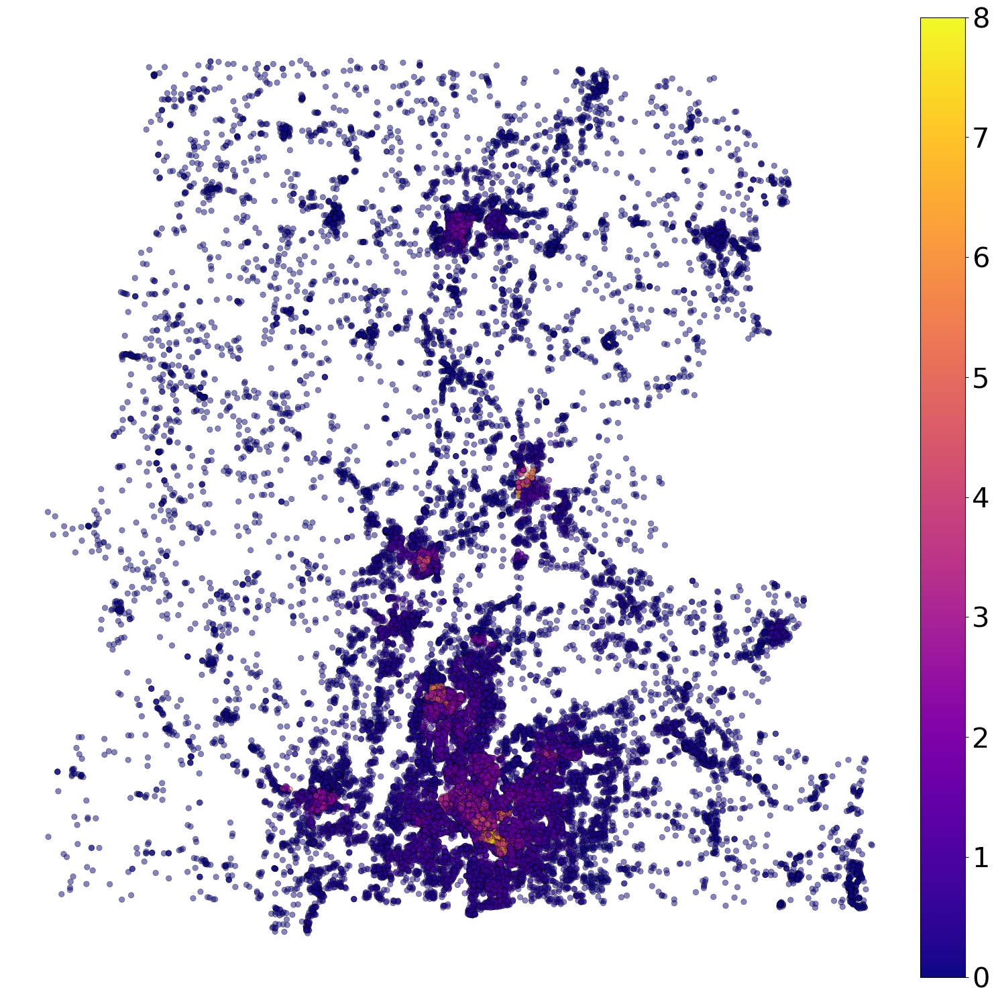

In [87]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
pv_nodes_demog_joint.plot('weighted_degree_popden', cmap='plasma', alpha=0.5, ax=ax, linewidth=.5, edgecolor='k',legend=True, cax=cax)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('../figures/pv-popdens-equity-weighted-node-degree.png',dpi=120)

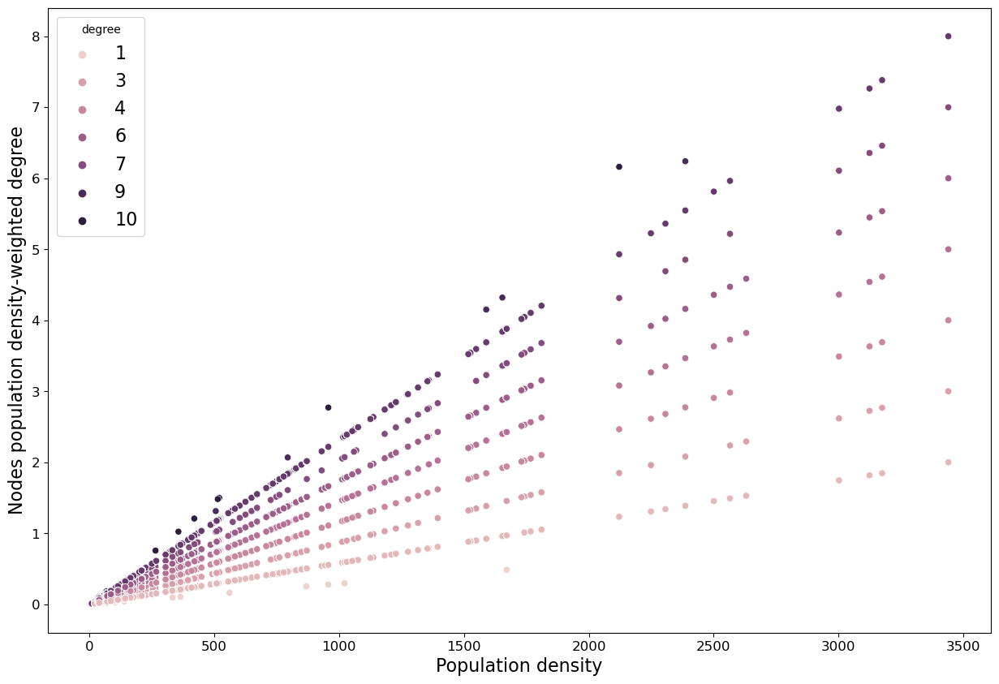

In [88]:
fig, ax = plt.subplots(figsize=(15,10))
hues=pv_nodes_demog_joint['degree']

fig = sns.scatterplot(data=pv_nodes_demog_joint, x='population_density_psqkm', y='weighted_degree_popden', hue=hues) #size=sizes,
#fig.set(xlabel='Popullation density', ylabel='Nodes popullation density-weighted degree')
fig.set_xlabel('Population density', fontsize=16)
fig.set_ylabel('Nodes population density-weighted degree', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.rcParams['legend.fontsize'] = 16
plt.savefig('../figures/population-vs-node-popullation-density-weighted-degree.png', dpi=400, bbox_inches='tight')
plt.show()

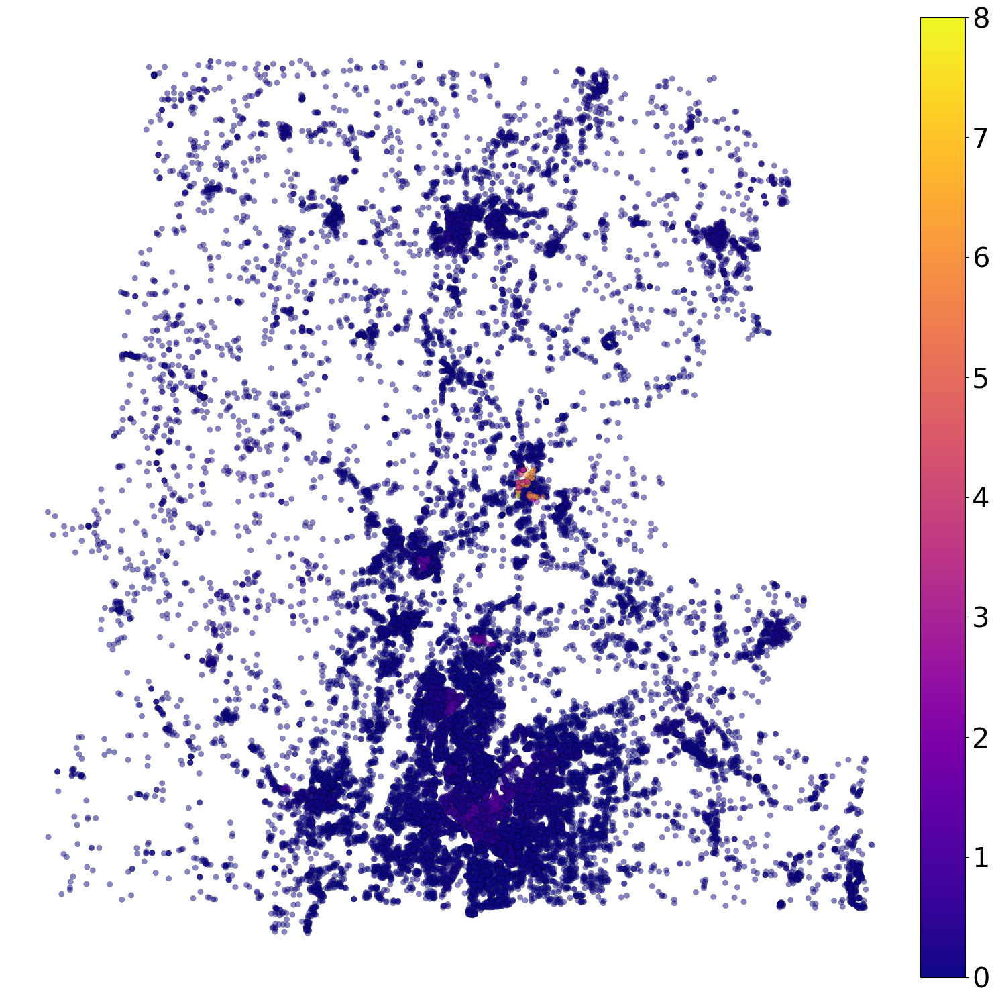

In [89]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
pv_nodes_demog_joint.plot('weighted_degree_income', cmap='plasma', alpha=.5, ax=ax, linewidth=.25, edgecolor='k',legend=True, cax=cax)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('../figures/pv-income-equity-weighted-node-degree.png',dpi=120)

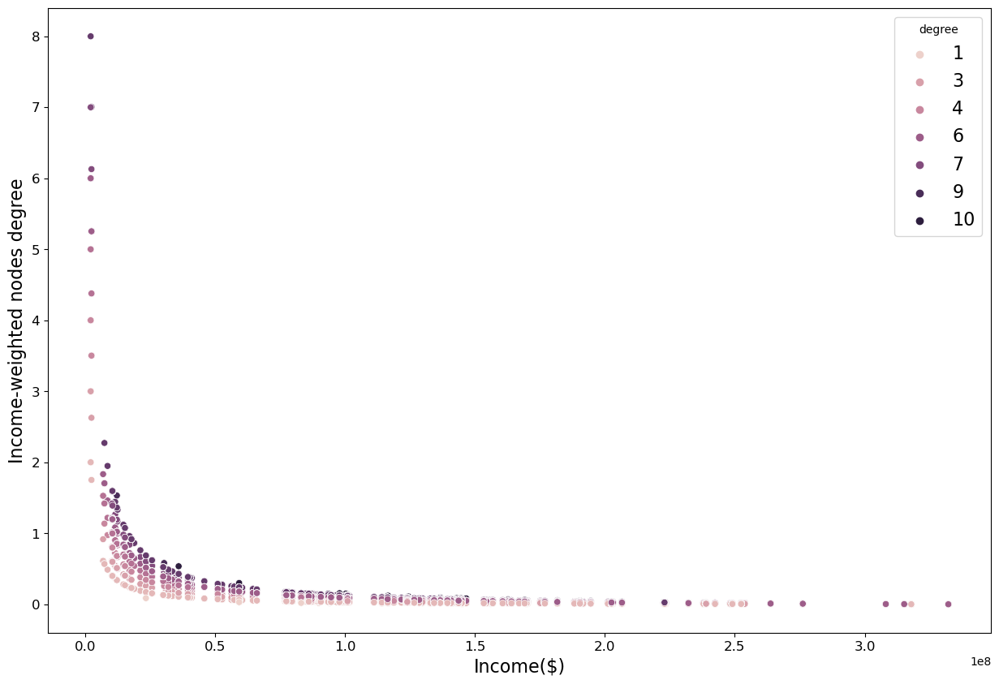

In [90]:
fig, ax = plt.subplots(figsize=(15,10))
hues=pv_nodes_demog_joint['degree']

fig = sns.scatterplot(data=pv_nodes_demog_joint, x='B19025A_001E', y='weighted_degree_income', hue=hues) #size=sizes,
#fig.set(xlabel='Income($)', ylabel='Income-weighted nodes degree')
fig.set_xlabel('Income($)', fontsize=16)
fig.set_ylabel('Income-weighted nodes degree', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.rcParams['legend.fontsize'] = 16
plt.savefig('../figures/income-vs-node-income-weighted-degree.png', dpi=400, bbox_inches='tight')
plt.show()

In [91]:
# log transformation

In [92]:
pv_nodes_demog_joint['log_population_density'] = np.log(pv_nodes_demog_joint['population_density_psqkm'] + 1)
pv_nodes_demog_joint['log_inverse_income'] = np.log(pv_nodes_demog_joint['inverse_income'])

pv_nodes_demog_joint['normalized_log_population_density'] = normalize(pv_nodes_demog_joint['log_population_density'])
pv_nodes_demog_joint['normalized_log_inverse_income'] = normalize(pv_nodes_demog_joint['log_inverse_income'])

pv_nodes_demog_joint['log_weighted_degree_income'] = pv_nodes_demog_joint['normalized_log_inverse_income'] * pv_nodes_demog_joint['degree']
pv_nodes_demog_joint['log_weighted_degree_popden'] = pv_nodes_demog_joint['normalized_log_population_density'] * pv_nodes_demog_joint['degree']

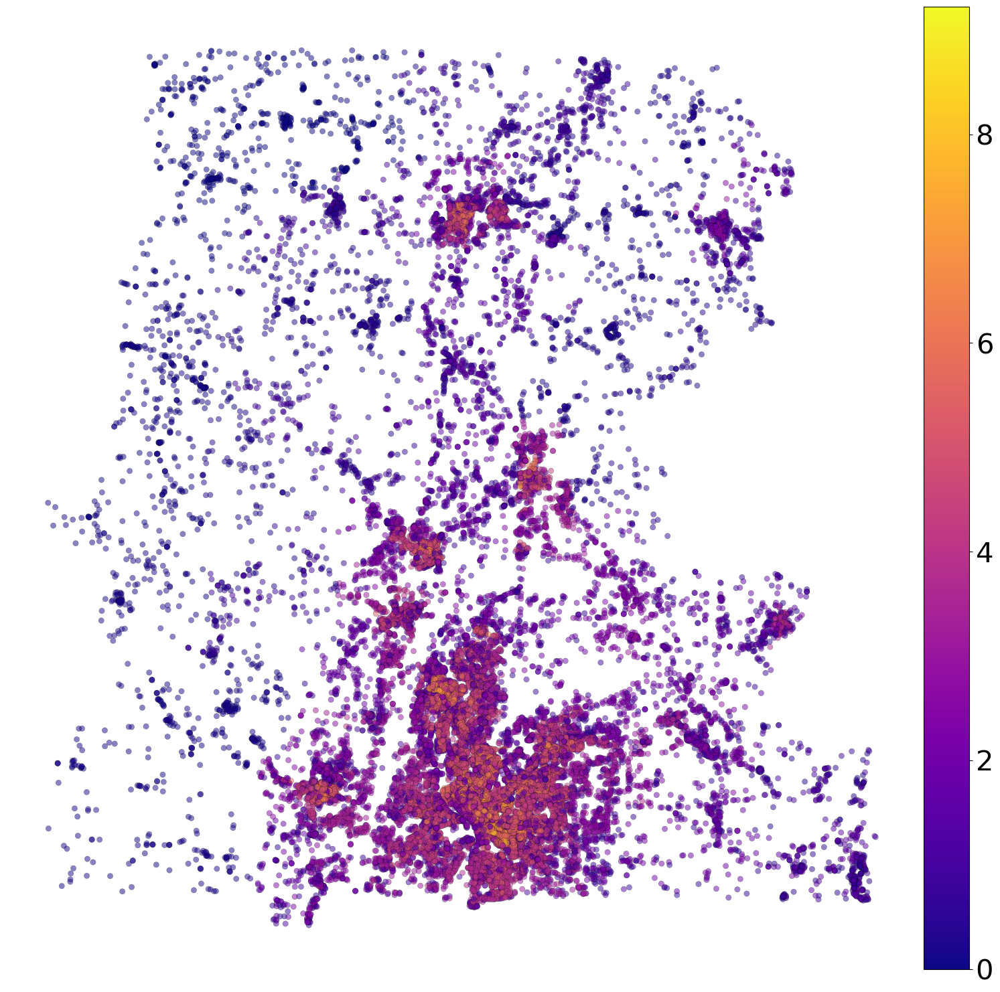

In [93]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
#pv_streets.plot(linewidth=.2, ax=ax, color='k')
pv_nodes_demog_joint.plot('log_weighted_degree_popden', cmap='plasma', alpha=0.5, ax=ax, linewidth=.25, edgecolor='k',legend=True, cax=cax)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('../figures/pv-log-popdens-equity-weighted-node-degree.png',dpi=120)

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_988\238816740.py:22: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


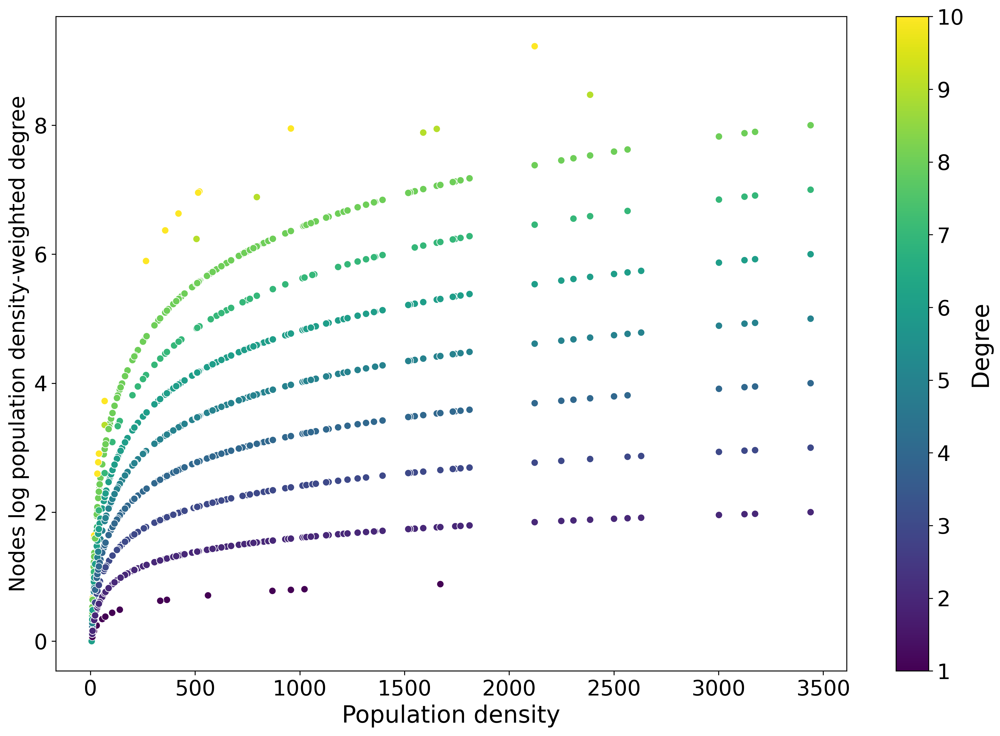

In [108]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
hues = pv_nodes_demog_joint['degree']

fig = sns.scatterplot(data=pv_nodes_demog_joint, x='population_density_psqkm', y='log_weighted_degree_popden', hue=hues, palette='viridis')
fig.set_xlabel('Population density', fontsize=20)
fig.set_ylabel('Nodes log population density-weighted degree', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Remove the current legend
plt.gca().legend_.remove()

# Create a custom legend with scientific notation
norm = plt.Normalize(hues.min(), hues.max())
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])

# Set the legend title, font size, and scientific notation format
cbar = plt.colorbar(sm)
cbar.set_label('Degree', fontsize=20)
cbar.ax.tick_params(labelsize=18)

plt.savefig('../figures/population-vs-node-log-population-density-weighted-degree.png', dpi=400, bbox_inches='tight')
plt.show()


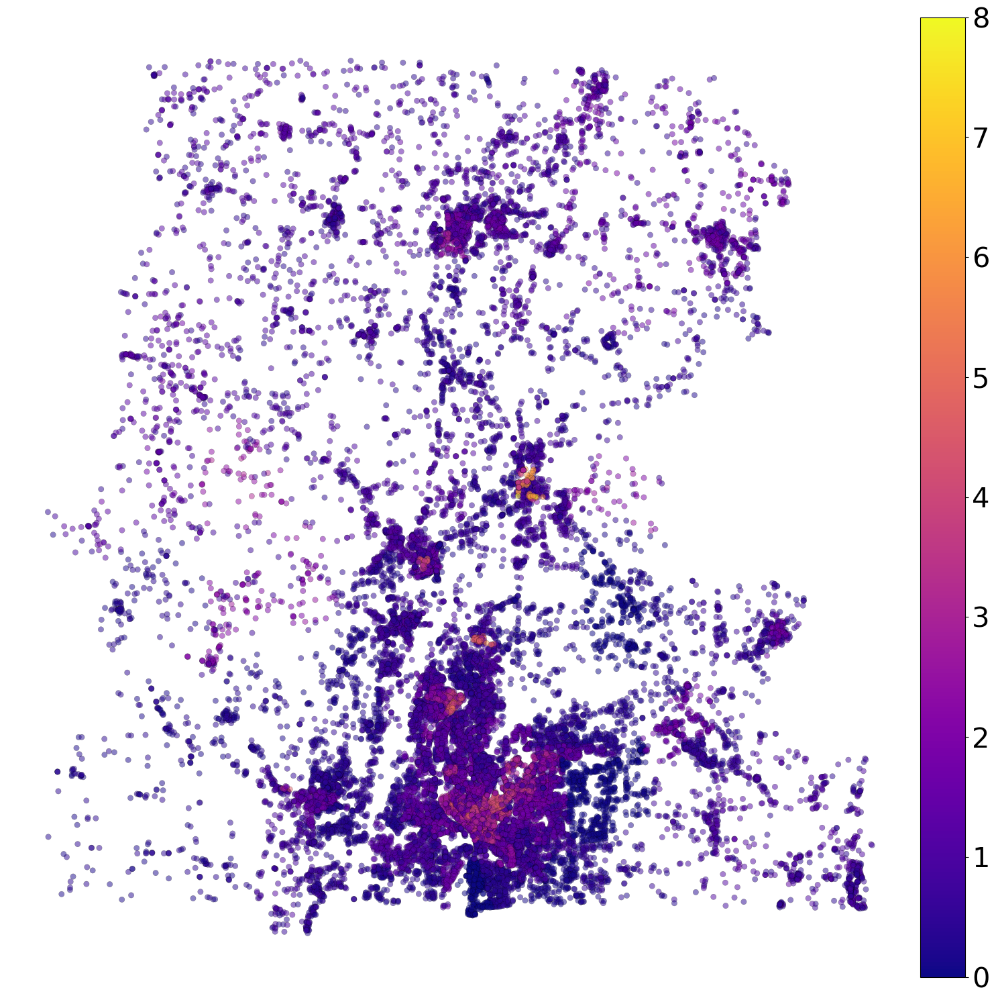

In [95]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
pv_nodes_demog_joint.plot('log_weighted_degree_income', cmap='plasma', alpha=.5, ax=ax, linewidth=.25, edgecolor='k',legend=True, cax=cax)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('../figures/pv-income-log-equity-weighted-node-degree.png',dpi=120)

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_988\1959989823.py:24: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


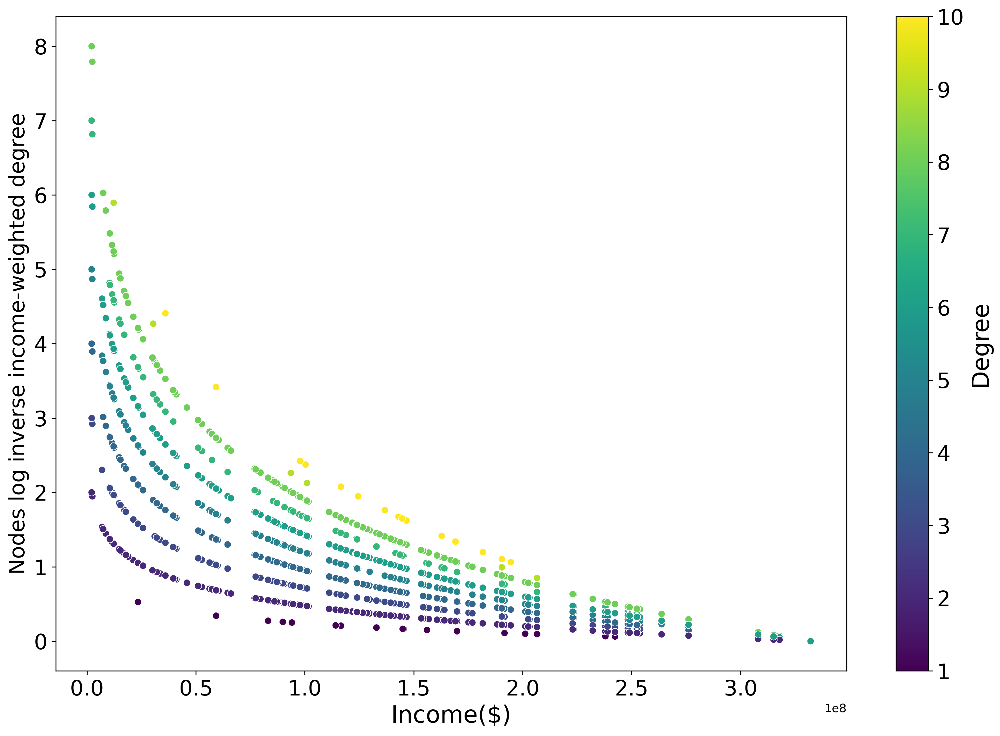

In [107]:
fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
hues = pv_nodes_demog_joint['degree']

fig = sns.scatterplot(data=pv_nodes_demog_joint, x='B19025A_001E', y='log_weighted_degree_income', hue=hues, palette='viridis')
fig.set_xlabel('Income($)', fontsize=20)
fig.set_ylabel('Nodes log inverse income-weighted degree', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Remove the current legend
plt.gca().legend_.remove()

# Create a custom legend with scientific notation
norm = plt.Normalize(hues.min(), hues.max())
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])

# Set the legend title, font size, and scientific notation format
cbar = plt.colorbar(sm)
cbar.set_label('Degree', fontsize=20)
cbar.ax.tick_params(labelsize=18)

plt.savefig('../figures/income-vs-node-log-income-weighted-degree.png', dpi=400, bbox_inches='tight')
plt.show()


In [97]:
# Integerate both weights
pv_nodes_demog_joint['log_weighted_degree_income_popdens'] = (pv_nodes_demog_joint['normalized_log_inverse_income']*0.5+0.5*pv_nodes_demog_joint['normalized_log_population_density']) * pv_nodes_demog_joint['degree']

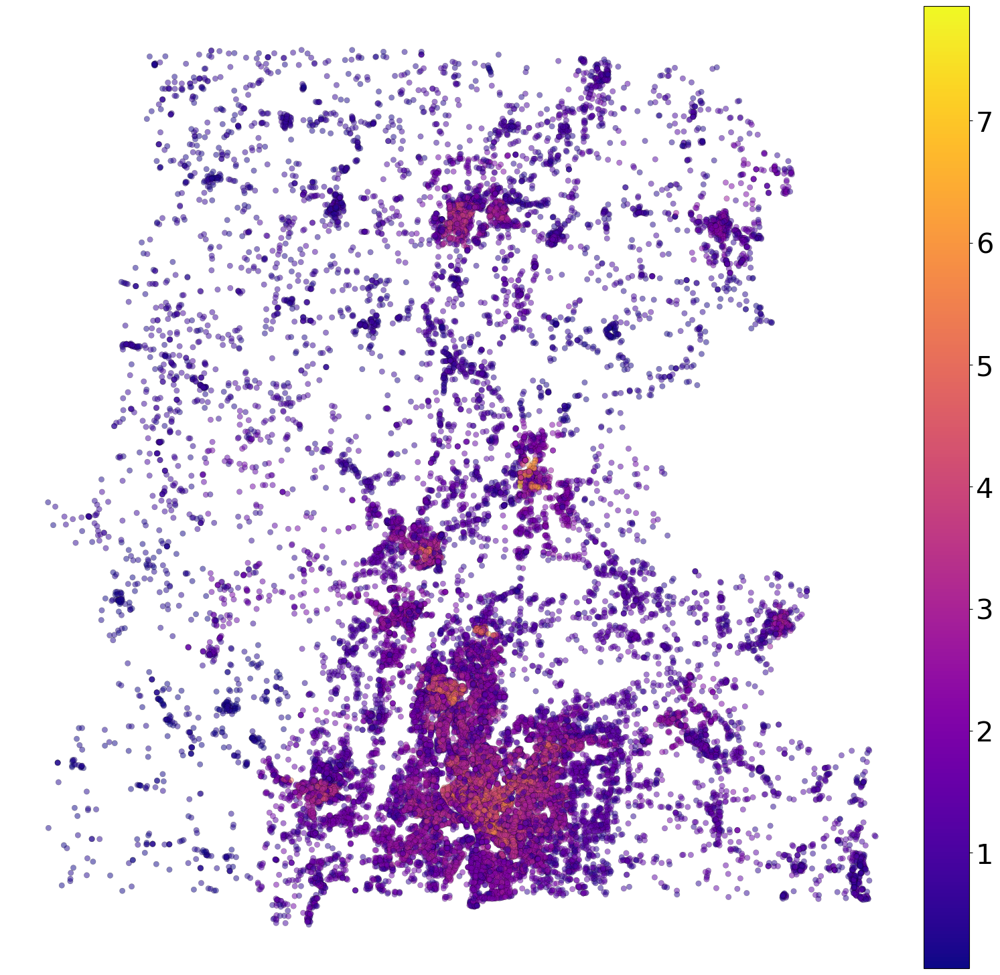

In [98]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
#pv_streets.plot(linewidth=.2, ax=ax, color='k')
pv_nodes_demog_joint.plot('log_weighted_degree_income_popdens', cmap='plasma', alpha=.5, ax=ax, linewidth=.25, edgecolor='k',legend=True, cax=cax)
ax.axis('off')
cax.tick_params(labelsize='30')
#cax.locator_params(labelsize='20')
plt.tight_layout()
plt.savefig('../figures/pv-popdensity-income-log-equity-weighted-node-degree.png',dpi=120)
#contextily.add_basemap(ax=ax, url=contextily.providers.CartoDB.Positron)
#ax.axis(aus_streets.total_bounds[[0,2,1,3]])
#ax.set_title('PV')
#ax.set_facecolor('k')

In [99]:
# plot un-weighted degree

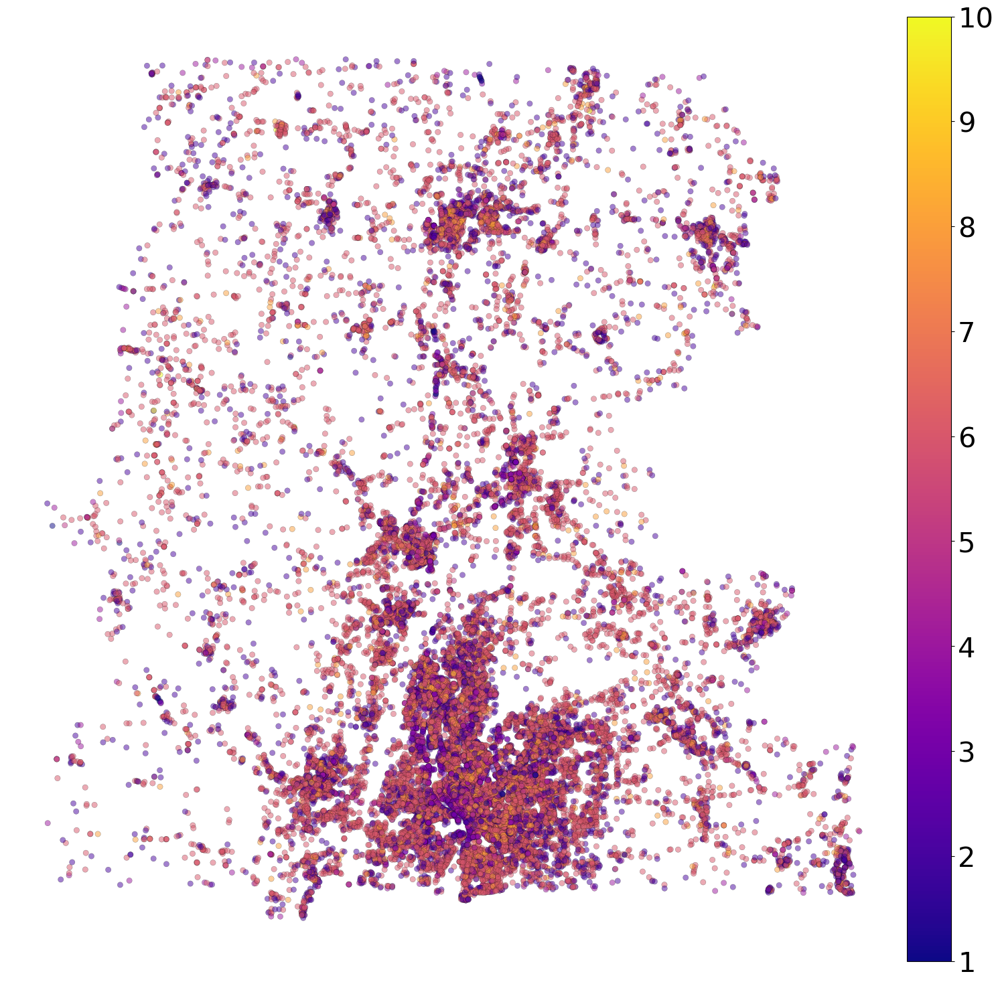

In [100]:
fig, ax = plt.subplots(figsize=(15,15))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
pv_nodes_demog_joint.plot('degree', cmap='plasma', alpha=0.5, ax=ax, linewidth=.25, edgecolor='k',legend=True, cax=cax)
ax.axis('off')
cax.tick_params(labelsize='30')
plt.tight_layout()
plt.savefig('../figures/pv-unweighted-node-degree.png',dpi=120)